# Shift mapping

This tutorial demonstrates...

Assume psf region and kernel maps already built

## Run photometry

In [1]:
import numpy as np
from pathlib import Path
from astropy.io import fits
from pathlib import Path
from astropy.io import fits
from mophongo.psf_map import PSFRegionMap
from mophongo.fit import FitConfig
from mophongo.catalog import Catalog
from mophongo import pipeline

data_dir = Path('../data')
field = 'uds-test'
#field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'

prm_kern = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_kernel_f770w.geojson'))
prm_444 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_psf.geojson'))
prm_770 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f770w_psf.geojson'))

# MIRI images
img_770 = fits.getdata(data_dir / f'{field}-f770w_sci.fits')
wht_770 = fits.getdata(data_dir / f'{field}-f770w_wht.fits')

# read in LW selected catalog
seg_LW = data_dir / f'{field}-LW_seg.fits'
cat444 = Catalog.from_fits(sci_444, wht_444, segmap=seg_LW, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, segmap=seg_LW, estimate_ivar=True) 

residual = [None, None, None, None]

/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Measuring inverse variance map...
Measuring inverse variance map...


/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/src/mophongo/catalog.py:344: RuntimeWarning: divide by zero encountered in divide
  error=np.sqrt(1.0 / self.ivar),


### Separate flux and astrometric fit

First fit fluxes, then astrometric shift field, iterate.

In [9]:
# test astrometry fit vs number of iterations for separate astro + flux fits
config = FitConfig(fit_astrometry_niter=0)
table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual = [res[0]]

cfgs = ({'poly':{'order': 1}},
        {'poly':{'order': 3}},
        {'gp':{'length_scale': 400}})  # initial guess: GP will optimize length_scale
        
astrom = [None]
for mdict in cfgs:
    # test astrometry fit vs number of iterations for separate astro + flux fits
    model = next(iter(mdict))
    config = FitConfig(fit_astrometry_niter=3,
                       astrom_model=model,
                       astrom_kwargs=mdict)
    table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                   cat444.segmap.data,
                                   weights=[cat444.ivar, cat770.ivar],
                                   catalog=cat444.table,
                                   psfs=[prm_444, prm_770],
                                   kernels=[None, prm_kern],
                                   wcs=[cat444.wcs] * 2,
                                   config=config)
    residual.append(res[0])
    astrom.append(fit.astro)


Pipeline (start) memory: 0.9 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=0, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_basis_order=1, astrom_kwargs={'poly': {'order': 2}, 'gp': {'length_scale': 400}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 1928.80it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.1 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2806.82it/s]


Pipeline (convolved) memory: 1.1 GB
Running iteration 1 of 1


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29038.42it/s]


Pipeline (residual) memory: 1.1 GB
Distribution >99% chi2: [13.74037661]
Adding 6 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32455.37it/s]


Done...
Pipeline (end) memory: 1.1 GB
Pipeline (start) memory: 1.1 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_basis_order=1, astrom_kwargs={'poly': {'order': 1}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4973.44it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.1 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2527.24it/s]


Pipeline (convolved) memory: 1.1 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28603.48it/s]


Pipeline (residual) memory: 1.1 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33214.29it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31230.00it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29525.38it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32087.48it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31026.20it/s]


Distribution >99% chi2: [5.90508144]
Adding 5 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33197.77it/s]


Done...
Pipeline (end) memory: 1.2 GB
Pipeline (start) memory: 1.2 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_basis_order=1, astrom_kwargs={'poly': {'order': 3}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4664.85it/s]

Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.2 GB
Using kernel lookup table uds-test-f444w_kernel_f770w



Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 1708.00it/s]


Pipeline (convolved) memory: 1.2 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28125.48it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33970.62it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30818.52it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30066.70it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28797.30it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33036.91it/s]


Distribution >99% chi2: [6.18498656]
Adding 5 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29640.08it/s]


Done...
Pipeline (end) memory: 1.2 GB
Pipeline (start) memory: 1.2 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_basis_order=1, astrom_kwargs={'gp': {'length_scale': 400}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4770.94it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.2 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2703.26it/s]


Pipeline (convolved) memory: 1.2 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 26948.97it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33050.54it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 25575.84it/s]

Pipeline (residual) memory: 1.2 GB



Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28849.67it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31880.62it/s]


Pipeline (residual) memory: 1.2 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31664.51it/s]


Distribution >99% chi2: [4.71172051]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30631.16it/s]


Done...
Pipeline (end) memory: 1.2 GB


In [3]:
# from matplotlib import pyplot as plt
# t = fit.templates[0]
# plt.imshow(t.data)
# print(t.data.max(),t.data.dtype)

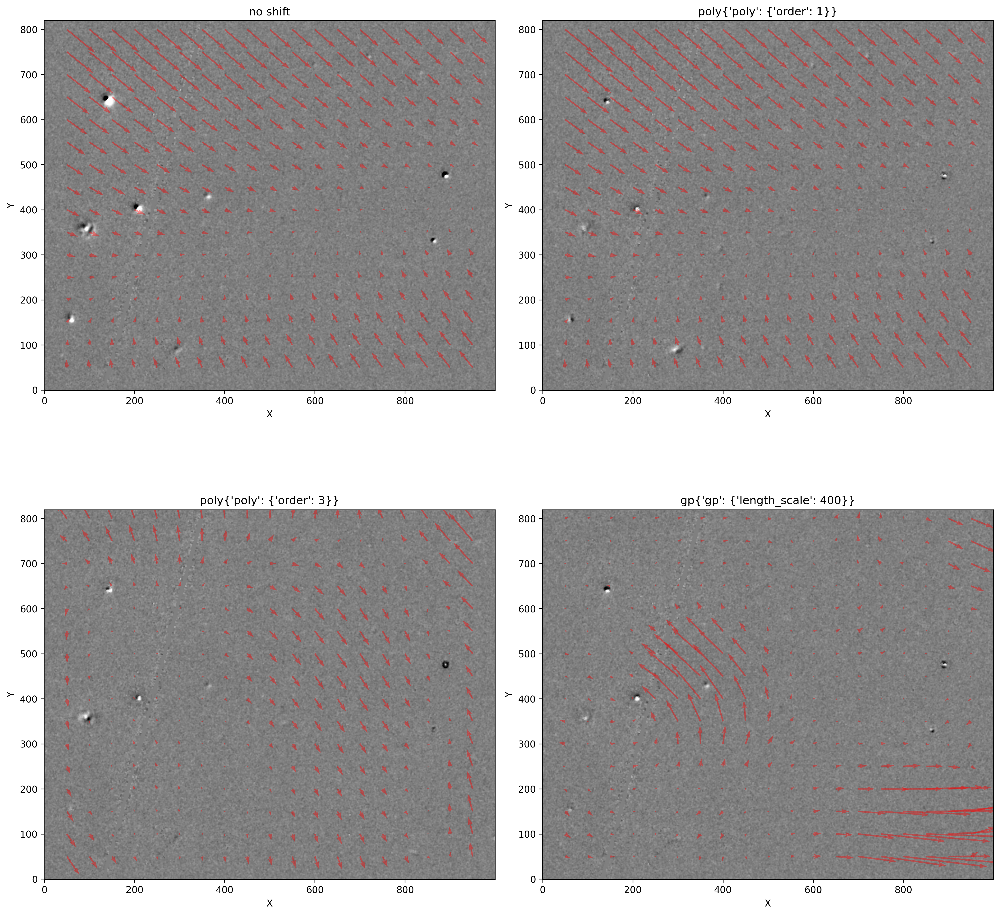

In [12]:
import numpy as np
import matplotlib.pyplot as plt

ny, nx = cat444.sci.shape
step = int(nx/20)
yg, xg = np.mgrid[step:ny:step, step:nx:step]
dx, dy = astrom[1](xg, yg)

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
ax[0].imshow(residual[0], origin='lower', cmap='gray', vmin=-1,vmax=1)
ax[0].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
ax[0].set_title("no shift") ; ax[0].set_xlabel("X") ; ax[0].set_ylabel("Y")
#ax[1].axis('off')

for i in range(1, len(ax)):
    dx, dy = astrom[i](xg, yg)
    ax[i].imshow(residual[i], origin='lower', cmap='gray', vmin=-1,vmax=1)
    ax[i].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
    ax[i].set_title(astrom[i].cfg.astrom_model+str(astrom[i].cfg.astrom_kwargs)) ; ax[i].set_xlabel("X") ; ax[i].set_ylabel("Y")
plt.tight_layout()
plt.show()

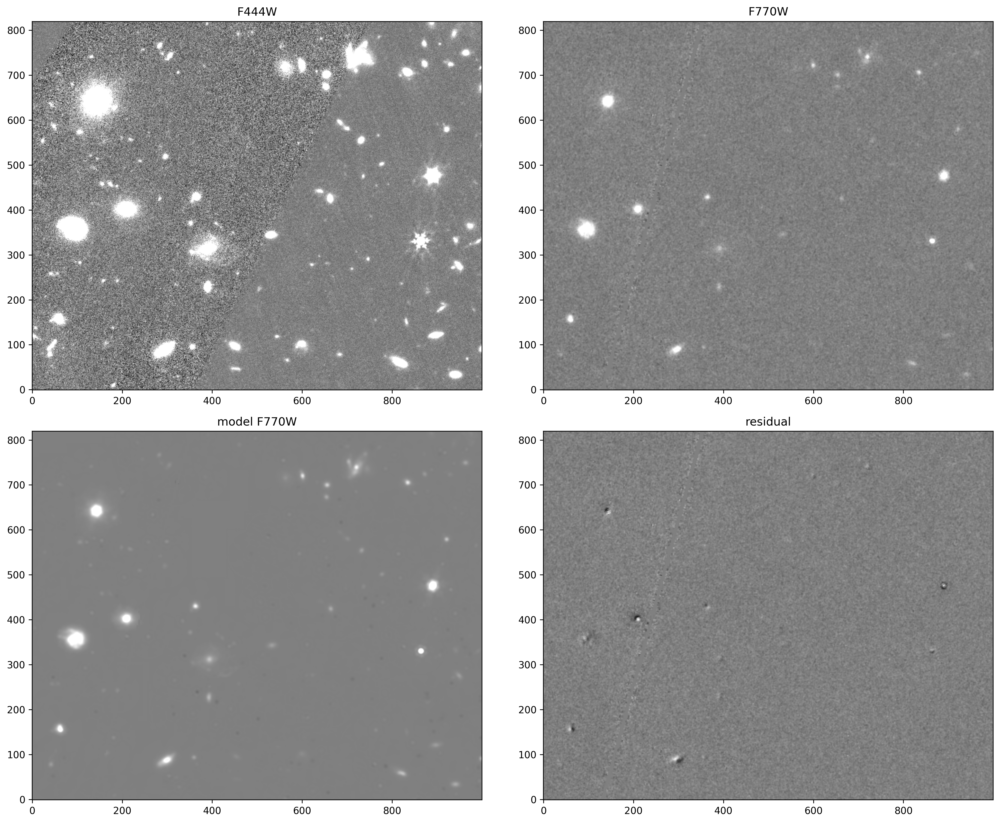

In [13]:
from matplotlib import pyplot as plt
img = [cat444.sci*10, cat770.sci, cat770.sci - residual[1], residual[1]] 
titles = ['F444W', 'F770W', 'model F770W', 'residual']
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
for i in range(4):
    ax[i].imshow(img[i], origin='lower', cmap='gray', vmin=-1, vmax=1)
    ax[i].set_title(f'{titles[i]}')
plt.tight_layout() 

In [ ]:
mdict = {'poly':{'order': 3}}

In [24]:
key, val = mdict.items()

ValueError: not enough values to unpack (expected 2, got 1)

In [27]:
k = mdict.keys()

In [28]:
k

dict_keys(['poly'])

In [35]:
model = next(iter(mdict))

In [36]:
model,args,mdict

('poly', {'order': 3}, {'poly': {'order': 3}})

In [8]:
fit.config.astrom_kwargs.get('gp')['length_scale']

400